# Visualize Sen2Venus Dataloader with Mask Collator

This notebook demonstrates how to load and visualize batches from the Sen2Venus dataset with the I-JEPA mask collator.

In [1]:
import sys
sys.path.append('/home/user/ijepa')

import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.gridspec import GridSpec
import yaml

from src.datasets.sen2venus import make_sen2venus_dataloader
from src.masks.multiblock import MaskCollator as MBMaskCollator

## Load Configuration

In [54]:
# Load config from YAML file
config_path = '/home/user/ijepa/configs/sen2venus_vits14_ep100.yaml'
with open(config_path, 'r') as f:
    config = yaml.safe_load(f)

config['data']['batch_size'] = 8

print("Configuration loaded:")
print(f"Dataset: {config['data']['dataset_name']}")
print(f"Use HR image: {config['data']['use_hr_image']}")
print(f"Batch size: {config['data']['batch_size']}")
print(f"Crop size: {config['data']['crop_size']}")

Configuration loaded:
Dataset: sen2venus
Use HR image: True
Batch size: 8
Crop size: 224


## Create Mask Collator

In [55]:
# Create mask collator
mask_collator = MBMaskCollator(
    input_size=config['data']['crop_size'],
    patch_size=config['mask']['patch_size'],
    pred_mask_scale=config['mask']['pred_mask_scale'],
    enc_mask_scale=config['mask']['enc_mask_scale'],
    aspect_ratio=config['mask']['aspect_ratio'],
    nenc=config['mask']['num_enc_masks'],
    npred=config['mask']['num_pred_masks'],
    allow_overlap=config['mask']['allow_overlap'],
    min_keep=config['mask']['min_keep']
)

print(f"Mask collator created with:")
print(f"  Patch size: {config['mask']['patch_size']}")
print(f"  Number of encoder masks: {config['mask']['num_enc_masks']}")
print(f"  Number of predictor masks: {config['mask']['num_pred_masks']}")

Mask collator created with:
  Patch size: 14
  Number of encoder masks: 1
  Number of predictor masks: 4


## Create Dataset and DataLoader

In [64]:
# Create dataloader
dataset, dataloader, sampler = make_sen2venus_dataloader(
    data_root=config['data']['dataset_root'],
    splits_file_path=config['data']['splits_file_path'],
    split='train',
    img_size=config['data']['crop_size'],
    hr_img_size=config['data'].get('hr_crop_size', None),
    use_hr_image=config['data']['use_hr_image'],
    batch_size=16,  # Use smaller batch for visualization
    collator=mask_collator,
    drop_last=True,
    pin_mem=False,
    num_workers=0,  # Use 0 workers for notebook
    world_size=1,
    rank=0
)

print(f"Dataset size: {len(dataset)}")
print(f"Number of batches: {len(dataloader)}")

Dataset size: 119659
Number of batches: 7478


## Load a Batch

In [65]:
# Get one batch
batch_iter = iter(dataloader)
batch_data, masks_enc, masks_pred = next(batch_iter)

images = batch_data[0]  # Images from the batch

print(f"Batch shape: {images.shape}")
print(f"Number of encoder masks: {len(masks_enc)}")
print(f"Number of predictor masks: {len(masks_pred)}")
print(f"Encoder mask 0 shape: {masks_enc[0].shape}")
print(f"Predictor mask 0 shape: {masks_pred[0].shape}")

Batch shape: torch.Size([16, 4, 224, 224])
Number of encoder masks: 1
Number of predictor masks: 4
Encoder mask 0 shape: torch.Size([16, 84])
Predictor mask 0 shape: torch.Size([16, 42])


## Helper Functions for Visualization

In [70]:
def denormalize_sen2venus(img, use_hr=True):
    """Denormalize Sen2Venus images"""
    if use_hr:
        # Venus normalization constants
        means = np.array([444.3010, 716.1393, 813.6448, 2605.5037])
        stds = np.array([279.9104, 385.4034, 648.5869, 797.1441])
    else:
        # Sentinel2 normalization constants
        means = np.array([443.8853, 715.6812, 813.2707, 2603.5852])
        stds = np.array([283.9673, 389.3354, 651.2451, 811.8329])
    
    img_denorm = img.clone()
    for c in range(4):
        img_denorm[c] = img_denorm[c] * stds[c] + means[c]
    
    return img_denorm

def normalize_for_display(channel):
    """Normalize a single channel to [0, 1] for display"""
    channel = channel.numpy()
    vmin, vmax = np.percentile(channel, (2, 98))
    return np.clip((channel - vmin) / (vmax - vmin + 1e-8), 0, 1)

def create_rgb_composite(img, denormalize=True, use_hr=True):
    """Create RGB composite from 4-channel image"""
    if denormalize:
        img = denormalize_sen2venus(img, use_hr=use_hr)
    
    # Normalize each channel for display
    rgb_display = np.stack([
        normalize_for_display(img[2]),
        normalize_for_display(img[1]),
        normalize_for_display(img[0])
    ], axis=-1)

    # import pdb; pdb.set_trace()
    
    return rgb_display

def create_mask_visualization(img_size, patch_size, mask_indices, color='red', alpha=0.3):
    """Create a visualization overlay for masks"""
    num_patches = img_size // patch_size
    mask_grid = np.zeros((num_patches, num_patches))
    
    for idx in mask_indices:
        row = idx // num_patches
        col = idx % num_patches
        mask_grid[row, col] = 1
    
    # Upsample to image size
    mask_vis = np.repeat(np.repeat(mask_grid, patch_size, axis=0), patch_size, axis=1)
    return mask_vis

## Visualize Images with All Channels

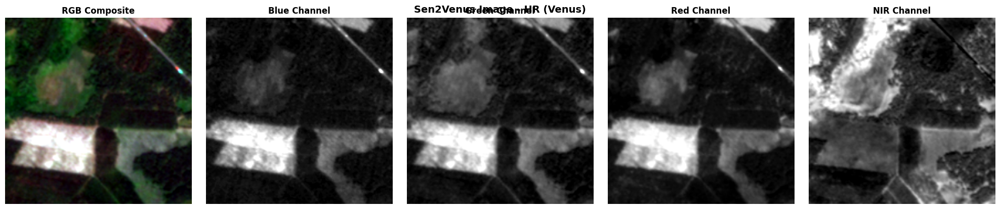

In [72]:
# Visualize first image in batch with all 4 channels
idx = 7
img = images[idx]

fig, axes = plt.subplots(1, 5, figsize=(20, 4))

# RGB composite
rgb = create_rgb_composite(img, denormalize=True, use_hr=config['data']['use_hr_image'])
axes[0].imshow(rgb)
axes[0].set_title('RGB Composite', fontsize=12, fontweight='bold')
axes[0].axis('off')

# Individual channels
channel_names = ['Blue', 'Green', 'Red', 'NIR']
for i in range(4):
    channel = normalize_for_display(img[i])
    axes[i+1].imshow(channel, cmap='gray')
    axes[i+1].set_title(f'{channel_names[i]} Channel', fontsize=12, fontweight='bold')
    axes[i+1].axis('off')

plt.tight_layout()
plt.suptitle(f'Sen2Venus Image - {"HR (Venus)" if config["data"]["use_hr_image"] else "LR (Sentinel2)"}', 
             fontsize=14, fontweight='bold', y=1.02)
plt.show()

## Visualize Masks

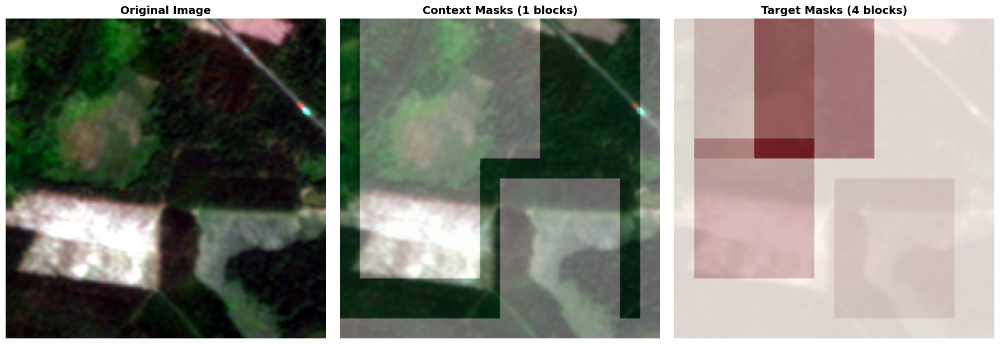

In [75]:
# Visualize masks for the first image
idx = 7
img = images[idx]
img_size = config['data']['crop_size']
patch_size = config['mask']['patch_size']

# Create RGB composite
rgb = create_rgb_composite(img, denormalize=True, use_hr=config['data']['use_hr_image'])

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Original image
axes[0].imshow(rgb)
axes[0].set_title('Original Image', fontsize=14, fontweight='bold')
axes[0].axis('off')

# Encoder (context) masks
axes[1].imshow(rgb)
for i, mask in enumerate(masks_enc):
    mask_vis = create_mask_visualization(img_size, patch_size, mask[idx].cpu().numpy())
    axes[1].imshow(mask_vis, alpha=0.4, cmap='Greens')
axes[1].set_title(f'Context Masks ({len(masks_enc)} blocks)', fontsize=14, fontweight='bold')
axes[1].axis('off')

# Predictor (target) masks
axes[2].imshow(rgb)
for i, mask in enumerate(masks_pred):
    mask_vis = create_mask_visualization(img_size, patch_size, mask[idx].cpu().numpy())
    axes[2].imshow(mask_vis, alpha=0.4, cmap='Reds')
axes[2].set_title(f'Target Masks ({len(masks_pred)} blocks)', fontsize=14, fontweight='bold')
axes[2].axis('off')

plt.tight_layout()
plt.show()

## Visualize Complete Batch

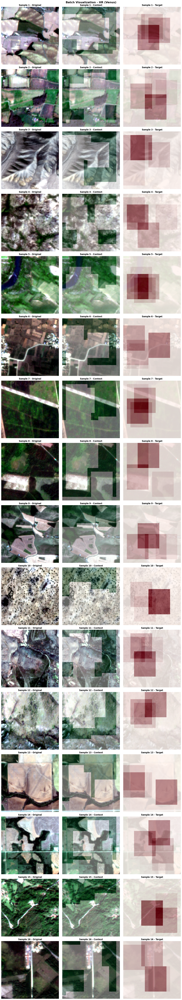

In [77]:
# Visualize all images in the batch
batch_size = images.shape[0]
fig, axes = plt.subplots(batch_size, 3, figsize=(15, 5*batch_size))

if batch_size == 1:
    axes = axes.reshape(1, -1)

for idx in range(batch_size):
    img = images[idx]
    rgb = create_rgb_composite(img, denormalize=True, use_hr=config['data']['use_hr_image'])
    
    # Original
    axes[idx, 0].imshow(rgb)
    axes[idx, 0].imshow(rgb)
    axes[idx, 0].set_title(f'Sample {idx+1} - Original', fontsize=12, fontweight='bold')
    axes[idx, 0].axis('off')
    
    # With context masks
    axes[idx, 1].imshow(rgb)
    for mask in masks_enc:
        mask_vis = create_mask_visualization(img_size, patch_size, mask[idx].cpu().numpy())
        axes[idx, 1].imshow(mask_vis, alpha=0.4, cmap='Greens')
    axes[idx, 1].set_title(f'Sample {idx+1} - Context', fontsize=12, fontweight='bold')
    axes[idx, 1].axis('off')
    
    # With target masks
    axes[idx, 2].imshow(rgb)
    for mask in masks_pred:
        mask_vis = create_mask_visualization(img_size, patch_size, mask[idx].cpu().numpy())
        axes[idx, 2].imshow(mask_vis, alpha=0.4, cmap='Reds')
    axes[idx, 2].set_title(f'Sample {idx+1} - Target', fontsize=12, fontweight='bold')
    axes[idx, 2].axis('off')

plt.tight_layout()
plt.suptitle(f'Batch Visualization - {"HR (Venus)" if config["data"]["use_hr_image"] else "LR (Sentinel2)"}',
             fontsize=16, fontweight='bold', y=1.001)
plt.show()

## Mask Statistics

In [25]:
# Calculate mask statistics
num_patches_per_side = img_size // patch_size
total_patches = num_patches_per_side ** 2

print(f"Total patches per image: {total_patches}")
print(f"Patches per side: {num_patches_per_side}")
print()

# Context masks
print("Context (Encoder) Masks:")
for i, mask in enumerate(masks_enc):
    num_patches = mask.shape[1]
    percentage = (num_patches / total_patches) * 100
    print(f"  Mask {i+1}: {num_patches} patches ({percentage:.1f}% of image)")

print()

# Target masks
print("Target (Predictor) Masks:")
for i, mask in enumerate(masks_pred):
    num_patches = mask.shape[1]
    percentage = (num_patches / total_patches) * 100
    print(f"  Mask {i+1}: {num_patches} patches ({percentage:.1f}% of image)")

Total patches per image: 256
Patches per side: 16

Context (Encoder) Masks:
  Mask 1: 85 patches (33.2% of image)

Target (Predictor) Masks:
  Mask 1: 42 patches (16.4% of image)
  Mask 2: 42 patches (16.4% of image)
  Mask 3: 42 patches (16.4% of image)
  Mask 4: 42 patches (16.4% of image)


## NIR vs RGB Comparison

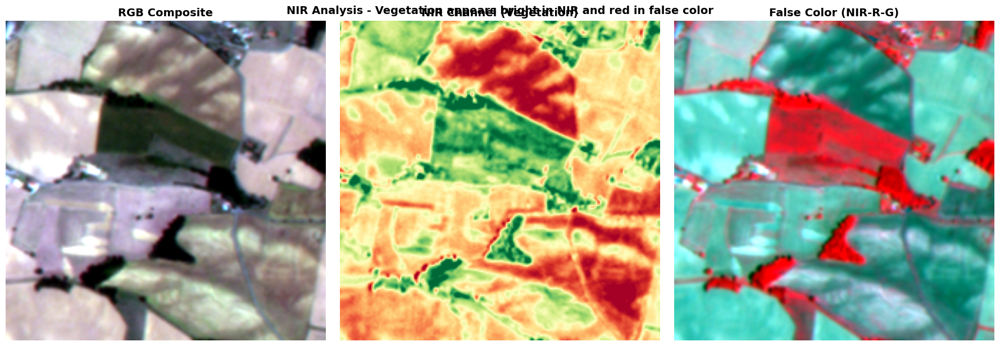

In [76]:
# Compare NIR with RGB for vegetation visualization
idx = 0
img = images[idx]

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# RGB composite
rgb = create_rgb_composite(img, denormalize=True, use_hr=config['data']['use_hr_image'])
axes[0].imshow(rgb)
axes[0].set_title('RGB Composite', fontsize=14, fontweight='bold')
axes[0].axis('off')

# NIR channel
nir = normalize_for_display(img[3])
axes[1].imshow(nir, cmap='RdYlGn')
axes[1].set_title('NIR Channel (Vegetation)', fontsize=14, fontweight='bold')
axes[1].axis('off')

# False color composite (NIR-R-G)
img_denorm = denormalize_sen2venus(img, use_hr=config['data']['use_hr_image'])
false_color = np.stack([
    normalize_for_display(img_denorm[3]),  # NIR -> Red
    normalize_for_display(img_denorm[2]),  # Red -> Green
    normalize_for_display(img_denorm[1]),  # Green -> Blue
], axis=-1)
axes[2].imshow(false_color)
axes[2].set_title('False Color (NIR-R-G)', fontsize=14, fontweight='bold')
axes[2].axis('off')

plt.tight_layout()
plt.suptitle('NIR Analysis - Vegetation appears bright in NIR and red in false color',
             fontsize=14, fontweight='bold', y=1.02)
plt.show()